# Исследование рынка общественного питания г. Москвы 

# Описание проекта

Инвестиционный фонд решил попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики пока еще определяются с выбором типа заведения: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены, но в качестве ориентира для своей бизнес-идеи рассматривают кафе "Central Perk" из культового ситкома "Friends".  
В связи с этим сформирован запрос — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.  
Для анализа доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках, и носит исключительно справочный характер.  
  
*Примечание:* В данном проекте используются библиотеки Plotly и Folium, графики и карты которых не отображаются на GitHub (здесь они заменены скриншотами). 
Для интерактивного отображения графиков Plotly и карт Folium рекомендуется открывать данный проект через [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb)

# Цель проекта

Провести исследование действующих заведений общественного питания г. Москвы на основе открытых данных и сформулировать рекомендации для открытия нового заведения.  

# Описание данных 

*Датасет moscow_places.csv*   
   
**name** — название заведения;  
**address** — адрес заведения;  
**category** — категория заведения («кафе», «пиццерия», «кофейня» и т.п.);  
**hours** — информация о днях и часах работы;  
**lat** — широта географической точки, в которой находится заведение;  
**lng** — долгота географической точки, в которой находится заведение;  
**rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
**price** — категория цен в заведении («средние», «ниже среднего», «выше среднего» и т.п.);  
**avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона («Средний счёт: 1000–1500 ₽», «Цена чашки капучино: 130–220 ₽», «Цена бокала пива: 400–600 ₽», и т.п.);  
**middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
- если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений,  
- если в строке указано одно число — цена без диапазона, то в столбец войдёт это число,  
- если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт;    

**middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
- если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений,  
- если в строке указано одно число — цена без диапазона, то в столбец войдёт это число,  
- если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт;  

**chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);  
**district** — административный район, в котором находится заведение, например Центральный административный округ;  
**seats** — количество посадочных мест.  

# Содержание

1 Загрузка и предобработка данных  
1.1 Импорт библиотек и загрузка данных  
1.2 Обзор данных  
2 Предобработка данных  
3 Анализ данных  
3.1 Исследование количества объектов общественного питания по категориям  
3.2 Исследование количества посадочных мест в заведениях по категориям  
3.3 Cоотношение сетевых и несетевых заведений в датасете  
3.4 Соотношение сетевых и несетевых заведений по категориям  
3.5 Топ-15 популярных сетей в Москве  
3.6 Соотношение категорий заведений по районам  
3.7 Распределение средних рейтингов по категориям заведений  
3.8 Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района  
3.9 Отображение всех заведений датасета на карте с помощью кластеров  
3.10 Топ-15 улиц по количеству заведений  
3.11 Улицы с одним объектом общепита  
3.12 Значения средних чеков заведений  
3.13 Выводы  
4 Детализация исследования: открытие кофейни  
4.1 Формирование рекомендации  
4.2 Выводы и рекомендации для открытия нового заведения  
5 Ссылка на презентацию  

## 1 Загрузка и предобработка данных

### 1.1 Импорт библиотек и загрузка данных

In [3]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [4]:
df = pd.read_csv('/datasets/moscow_places.csv')

### 1.2 Обзор данных

Выведем первые 5 строк датасета, общую информацию о нем, а также воспользуемся методом `describe()` для знакомства с числовыми значениями:

In [5]:
display(df.head())
print(df.info())
df.describe()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


**Вывод**: 

Первоначальный обзор данных показал следующее:
- датасет содержит 8406 строк с данными о кафе и ресторанах;
- в столбцах **hours**, **price**, **avg_bill**, **middle_avg_bill**, **middle_coffee_cup** и **seats** есть пропуски;
- целочисленные значения столцов **middle_avg_bill** и **seats** представлены типом `float64`, при этом тип `int`, в отличие от `float`, не предусматривает обозначения "NaN", поэтому сначала нужно будет решить, что делать с пропусками;
- названия округов в столбце **district** представлены в виде полных наименований, для удобства их можно заменить на более привычную аббревиатуру;   
- в столбцах **middle_coffee_cup** и **seats** максимальные значения выглядят аномально высокими, в них же присутствуют нулевые значения, учтем это в процессе исследования. 

Всю необходимую корректировку, а также проверку на дубликаты, проведем в следующем разделе.

## 2 Предобработка данных

**Проверим данные на наличие дубликатов:**

In [6]:
print('Количество дубликатов:', df[['name', 'address']].duplicated().sum())

Количество дубликатов: 0


Дубликатов нет, теперь посмотрим, есть ли неявные дубликаты, связанные с ошибками при формировании датасета:

In [7]:
print(df['name'].sort_values().unique().tolist())

['#КешбэкКафе', '+39 Pizzeria Mozzarella bar', '1 Этаж', '1-я Креветочная', '10 Идеальных Пицц', '1001 Ночь', '100ловая', '100лоффка', '13', '13 Chef doner', '15 Kitchen+Bar', '15-й Шар', '16 Июня', '16 Тонн', '18 Грамм', '1901 Comfort Food Zone', '1у', '2 Типа', '2-й Этаж', '2046', '21 Век', '22 Акра Кофе&Хлеб', '2U-Ту-Ю', '3 Ступени', '351 Bar', '4 Сезона', '4.2. Bar', '4/1 Restaurant', '42 Coffee Shop', '47', '495', '4friends Coffee', '4tuna Cafe&Grill', '5 Stars Coffee', '55.709201, 37.392257', '6 Am Bread Kitchen', '6 Рукопожатий', '69 раков', '7 Сэндвичей', '7 элемент', '7/12', '8 Oz', '8 Вафель', '8 Зёрен', '8 Пончиков', '800°с Contemporary Steak', '8bit Pizza', '9 Bar Coffe', '9 Bar Coffee', '9 Зёрен', 'A-cafe', 'ABC Coffee Roasters', 'ABC coffee roasters', 'Acai Family', 'Accent', "Adam's Chicken", 'Adria Mare', 'Ahava', 'Air Coffee', 'Al Halal', 'Al33 Пиццерия бар Боттега', 'All Day', 'Alma', 'Alternative coffee', 'Aly’s Poke', 'Amande', 'Amarena', 'Americano Black Coffee & F

В списке есть много похожих названий, но в ресторанном бизнесе часто используются названия, созвучные с более известными конкурентами. В то же время есть очевидные ошибки, к примеру с точкой и без точки в названии: 'Яндекс Лавка' и 'Яндекс.Лавка', а также названия с различным регистром букв: 'Шашлык на Углях' и 'Шашлык на углях'. Исправим эти ошибки и проверим наличие дубликатов еще раз:

In [8]:
df['name'] = [x.lower().replace('.', ' ') for x in df['name']]  # приводим к нижнему регистру и меняем точку на пробел
print('Количество дубликатов:', df[['name', 'address']].duplicated().sum())  # проводим повторную проверку на дубликаты

Количество дубликатов: 3


Теперь найдено три дубликата, удалим их: 

In [9]:
df.drop_duplicates(subset=['name', 'address'], inplace = True)
print('Количество дубликатов:', df[['name', 'address']].duplicated().sum())  # контролируем результат

Количество дубликатов: 0


**Посчитаем процент пропущенных значений по столбцам:**

In [10]:
print('\033[1m' f'Процент пропусков по столбцам:' '\033[0m')
(df.isna().mean() * 100).round(1)

Процент пропусков по столбцам:


name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.5
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

Процент пропусков достаточно большой, поэтому удалять данные с пропусками нельзя, это исказит результаты исследования. При необходимости, их можно заполнить медианными значениями по типам заведений, их принадежности к сети (для сетевых), и по районам расположения для остальных. В рамках данной работы можно обойтись без этих пропущенных значений, поэтому пропуски заполнять не будем. 

**Создадим столбец street с названиями улиц** (из столбца с адресом):

In [11]:
df['street'] = df['address'].str.split(', ').apply(lambda x: x[1])
print(df['street'].unique().tolist())  # контролируем результат

['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко', 'Правобережная улица', 'Ижорская улица', 'Дмитровское шоссе', 'Ангарская улица', 'Левобережная улица', 'МКАД', 'Базовская улица', 'улица Бусиновская Горка', 'Ленинградское шоссе', 'Коровинское шоссе', 'Ижорский проезд', 'Прибрежный проезд', 'Лобненская улица', 'парк Левобережный', 'Угличская улица', 'Абрамцевская улица', 'ландшафтный заказник Лианозовский', 'Череповецкая улица', 'Алтуфьевское шоссе', 'Лианозовский парк культуры и отдыха', 'Дубнинская улица', 'Илимская улица', 'Шенкурский проезд', 'Новгородская улица', 'парк Алтуфьево', 'улица Пришвина', 'бульвар Академика Ландау', 'улица Лескова', 'улица Плещеева', 'Бибиревская улица', 'Лианозовский проезд', 'Челобитьевское шоссе', 'Костромская улица', 'Карельский бульвар', 'Инженерная улица', 'парк Ангарские пруды', 'улица Софьи Ковалевской', 'улица Корнейчука', 'Проектируемый проезд № 5265', 'улица Римского-Корсакова', 'улица 800-летия Москвы', 'Юрловский проезд', 'па

**Создадим столбец is_24/7** с обозначением, что заведение работает ежедневно и круглосуточно (24/7) и заполним его логическими значениями: 
- True — если заведение работает ежедневно и круглосуточно;
- False — в противоположном случае.


In [12]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df[['name', 'address', 'street', 'hours', 'is_24/7']].head(15)  # контролируем результат

,name,address,street,hours,is_24/7
0,wowфли,"Москва, улица Дыбенко, 7/1",улица Дыбенко,"ежедневно, 10:00–22:00",False
1,четыре комнаты,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко,"ежедневно, 10:00–22:00",False
2,хазри,"Москва, Клязьминская улица, 15",Клязьминская улица,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,dormouse coffee shop,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко,"ежедневно, 09:00–22:00",False
4,иль марко,"Москва, Правобережная улица, 1Б",Правобережная улица,"ежедневно, 10:00–22:00",False
5,sergio pizza,"Москва, Ижорская улица, вл8Б",Ижорская улица,"ежедневно, 10:00–23:00",False
6,огни города,"Москва, Клязьминская улица, 9, стр. 3",Клязьминская улица,пн 15:00–04:00; вт-вс 15:00–05:00,False
7,mr уголёк,"Москва, Клязьминская улица, 9, стр. 3",Клязьминская улица,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",False
8,donna maria,"Москва, Дмитровское шоссе, 107, корп. 4",Дмитровское шоссе,"ежедневно, 10:00–22:00",False
9,готика,"Москва, Ангарская улица, 39",Ангарская улица,"ежедневно, 12:00–00:00",False


**Заменим длинные названия округов на более привычную аббревиатуру**, так она будет легче читаться на графиках:

In [13]:
print('До замены:', df['district'].unique())

До замены: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [14]:
df_2 = df.replace({'district':{'Северный административный округ': 'САО', 'Северо-Восточный административный округ': 'СВАО',
                            'Северо-Западный административный округ': 'СЗАО', 'Западный административный округ': 'ЗАО',
                             'Центральный административный округ': 'ЦАО', 'Восточный административный округ': 'ВАО',
                             'Юго-Восточный административный округ': 'ЮВАО', 'Южный административный округ': 'ЮАО',
                             'Юго-Западный административный округ': 'ЮЗАО'}})
print('После замены:',df_2['district'].unique())  # контролируем результат

После замены: ['САО' 'СВАО' 'СЗАО' 'ЗАО' 'ЦАО' 'ВАО' 'ЮВАО' 'ЮАО' 'ЮЗАО']


**Выводы:**  

Обнаружено достаточно большое количество пропусков в данных, вероятнее всего это связано с трудностями сбора данных из-за динамичного развития рынка (открытием, изменением, закрытием заведений и т.п.). Чтобы не искажать результаты исследования, было принято решение оставить пропуски без изменений, т.е. не удалять их и не заполнять другими подходящими значениями.

Обнаружены и удалены дубликаты, созданы необходимые столбцы **street** и **is_24/7**, произведена замена полных названий округов на более привычную в использовании аббревиатуру.

Данные готовы для дальнейшей работы над проектом.


## 3 Анализ данных

### 3.1 Исследование количества объектов общественного питания по категориям

Сгруппируем объекты по категориям, посчитаем процентное соотношение и визуализируем полученные данные:

категория,кол-во объектов,доля
кафе,2377,28.3%
ресторан,2042,24.3%
кофейня,1413,16.8%
"бар,паб",764,9.1%
пиццерия,633,7.5%
быстрое питание,603,7.2%
столовая,315,3.7%
булочная,256,3.0%


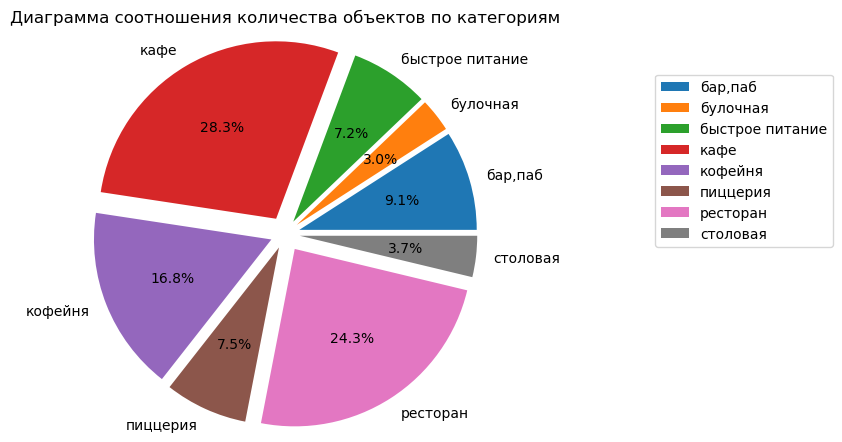

In [15]:
name_by_category = df_2.groupby('category').agg({'name': 'count'}).reset_index() # группируем объекты по категориям
name_by_category.columns = ['категория', 'кол-во объектов']  # задаем наименования столбцов
name_by_category['доля'] = name_by_category['кол-во объектов'] / name_by_category['кол-во объектов'].sum() # считаем доли
display(name_by_category.sort_values(by='кол-во объектов', ascending=False)
        .style.format({'доля': '{:.1%}'}).hide(axis='index'))  # выводим таблицу

# строим  гистограмму по кол-ву объектов и настраиваем параметры
fig = px.bar(name_by_category, x='категория', y='кол-во объектов', text='кол-во объектов')
fig.update_layout(title='Количество объектов общественного питания по категориям',
                  xaxis_title='Категории', yaxis_title='Количество объектов',
                  xaxis={'categoryorder':'total descending'})
fig.data[0].marker.line.width = 2
fig.data[0].marker.line.color = 'blue'
fig.update_traces(marker={'opacity': 0.6})
fig.show()  # выводим гистограмму

# строим диаграмму соотношения и настраиваем параметры
name_by_category.plot(kind='pie', y='кол-во объектов', labels=name_by_category['категория'], autopct='%.1f%%', radius=1.2,
                      explode=(0.1, 0.1, 0.1, 0.12, 0.1, 0.1, 0.12, 0.1))
plt.title('Диаграмма соотношения количества объектов по категориям', size=12, y=1.05)
plt.ylabel(None)
plt.legend(bbox_to_anchor=(2, 0.95))
plt.show()  # выводим диаграмму

**Скриншот графика Plotly для сайта GitHub** (для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))
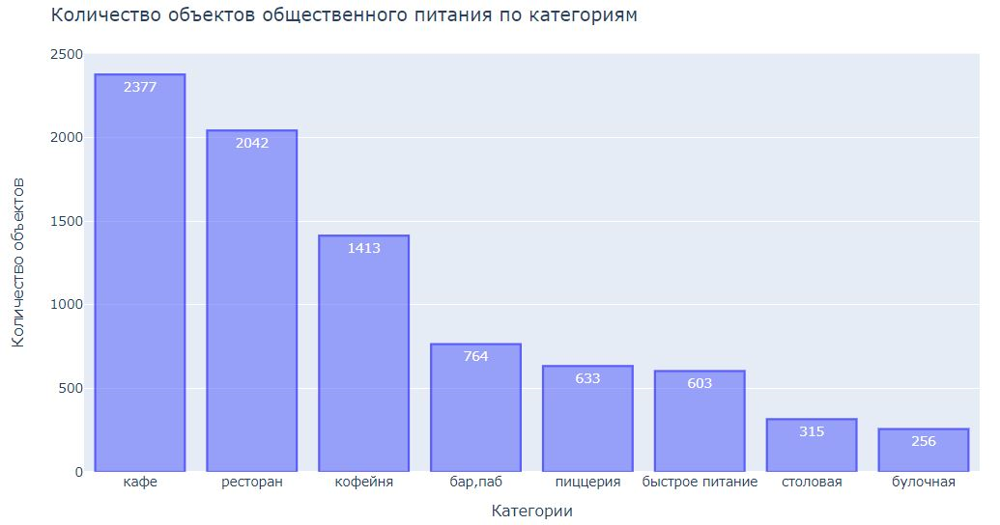

Наибольшее количество заведений (2377) относится к категории кафе, что составляет 28,3% от общего кол-ва объектов общественного питания в г. Москве. На втором месте находятся рестораны (2042), их 24,3% от общего кол-ва. Таким образом, более половины заведений г. Москвы относятся к категориям кафе и рестораны. Наименьшее кол-во заведений представлено в категории булочная, их всего 256, что составляет 3% от общего кол-ва.

### 3.2 Исследование количества посадочных мест в заведениях по категориям

Поскольку в наших данных присутствуют выбросы, для сравнения категорий заведений по кол-ву мест, правильнее будет использовать медианные значения. Сгруппируем данные в таблицу с сортировкой медианных значений по убыванию:

In [17]:
seats_by_category = df_2.groupby('category').agg({'seats': 'median'}).reset_index()
seats_by_category.columns = ['категория', 'кол-во посадочных мест']
seats_by_category.sort_values(by='кол-во посадочных мест', ascending=False
                             ).style.format({'кол-во посадочных мест': '{:.1f}'}).hide(axis='index')

категория,кол-во посадочных мест
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


Больше всего посадочных мест наблюдается в ресторанах и барах, что вполне объяснимо, покольку люди в таких заведениях сидят намного дольше. Меньше всего посадочных мест в булочных и пиццериях, что также объяснимо - там значительно выше доля заказов "на вынос" и  с доставкой. Для визуализации будем использовать "ящики с усами", так мы сможем оценить оценить выбросы:

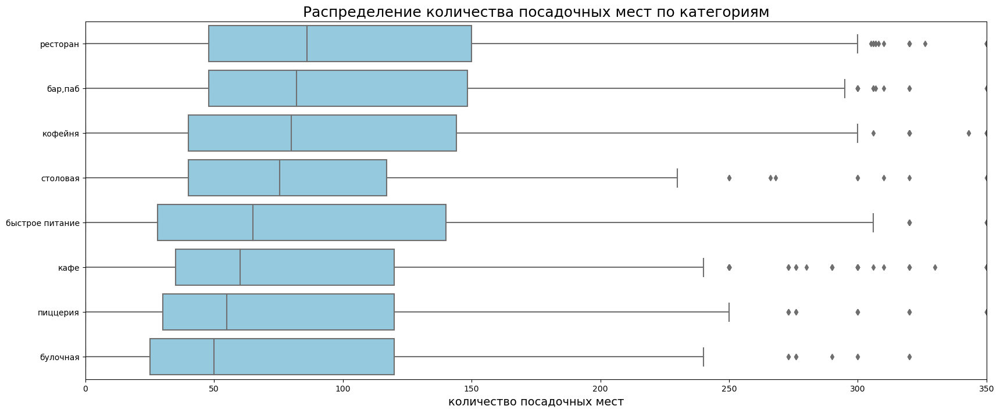

In [18]:
plt.figure(figsize=(20, 8))
sort_by = pd.DataFrame({col:vals['seats'] for col, vals in df_2.groupby(['category'])}  
                      ).median().sort_values(ascending=False).index  # записываем переменную для сортировки медиан по убыванию
sns.boxplot(data=df_2, x='seats', y='category', order=sort_by, color='skyblue')  # строим boxplot с сортировкой по медианам
plt.title('Распределение количества посадочных мест по категориям', size=18)
plt.xlabel('количество посадочных мест', size=14)
plt.xlim([0,350])
plt.ylabel(None)
plt.show()

Большинство заведений имеет до 300 мест, что не удивительно, поскольку согласно действующих требований надзорных органов, заведения с количеством посадочных мест более 300 требуют специального плана возведения. По максимальным значениям (в нашем случае и по размаху) лидируют рестораны, бары/пабы, кофейни и рестораны быстрого питания.

### 3.3 Cоотношение сетевых и несетевых заведений в датасете

Посчитаем количество сетевых и несетевых заведений и выведем диаграмму:

принадлежность к сети,кол-во заведений,доля
0,5200,61.9%
1,3203,38.1%


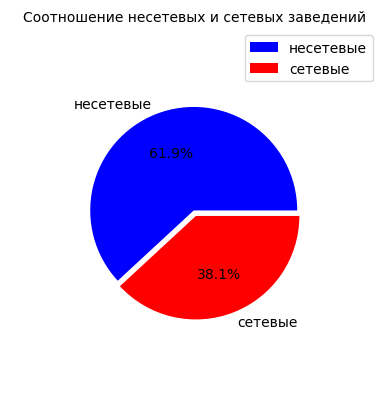

In [19]:
is_chain = df_2['chain'].value_counts().reset_index()  # считаем кол-во заведений по меткам принадлежности к сети
is_chain.columns = ['принадлежность к сети', 'кол-во заведений']  # назначаем названия столбцов
is_chain['доля'] = is_chain['кол-во заведений'] / is_chain['кол-во заведений'].sum() # считаем доли
display(is_chain.sort_values(by='кол-во заведений', ascending=False)
        .style.format({'доля': '{:.1%}'}).hide(axis='index'))  # выводим таблицу

# строим диаграмму и настраиваем параметры
colors = ("blue", "red") 
is_chain.plot(kind='pie', y='кол-во заведений', labels=['несетевые', 'сетевые'],
              autopct='%.1f%%', radius=0.7, colors=colors, explode=(0.02, 0.02))
plt.title('Соотношение несетевых и сетевых заведений', size=10)
plt.ylabel(None)
plt.show()  # выводим диаграмму


В датасете представлено 5200 несетевых заведений, что составляет 61,9% от общего кол-ва и 3203 сетевых заведения, что составляет 38,1% от общего кол-ва. В Москве несетевые заведения преобладают, что говорит о высокой активности частных предпринимателей на этом рынке.

### 3.4 Соотношение сетевых и несетевых заведений по категориям

Проверим соотношение количества сетевых и несетевых заведений по категориям, и выясним, какие категории заведений чаще являются сетевыми. Для этого сгруппируем данные и построим гистограмму:

In [20]:
# группируем данные по категориям и принадлежности к сети
category_by_chain = df_2.groupby(['category', 'chain'])['name'].agg('count'
                                                                   ).reset_index().sort_values(by='name', ascending=False)
# считаем соотношения
ratio_category_by_chain = df_2.groupby(['category', 'chain']).size().groupby(level=0
                                                              ).apply(lambda x: round(100 * x / float(x.sum()), 2)
                                                                    ).reset_index().rename(columns={0: 'ratio'})
# объединяем таблицы
category_by_chain = pd.merge(category_by_chain, ratio_category_by_chain, how='left', on=['category', 'chain'])

# настраиваем и выводим визуализацию
fig = px.bar(ratio_category_by_chain, x='ratio', y='category',
             color=ratio_category_by_chain['chain'].map({0:'Несетевые', 1:'Сетевые'}), width=800, height=500, text_auto='ratio')
fig.update_layout(title='Процентное соотношение несетевых и сетевых заведений по категориям',
                  xaxis_title=None, yaxis_title=None,
                  xaxis=dict(tickmode='array',tickvals=ratio_category_by_chain['category'],
                             ticktext=ratio_category_by_chain['category']), legend_title='')
fig.show()

**Скриншот графика Plotly для сайта GitHub** (для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))
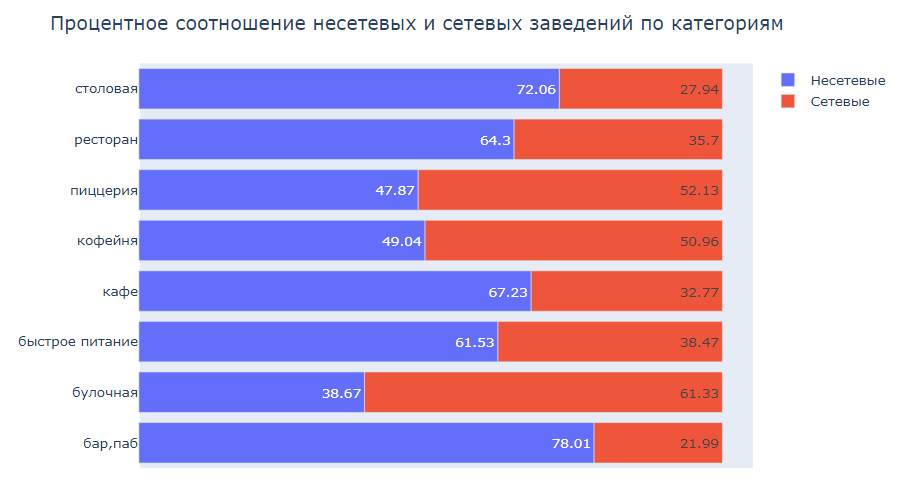

Выявлено три категории, в которых сетевых заведений больше - это кофейни, пиццерии и булочные.

### 3.5 Топ-15 популярных сетей в Москве

**Визуализируем данные с названиями топ-15 популярных сетей в Москве**. Для этого отфильтруем данные, оставив в них только сетевые заведения, затем сгруппируем, выведем гистограмму и посчитаем, сколько всего заведений попало в список Топ-15 и какой процент они составляют от общего количества:

In [21]:
df_chain = df_2[df_2['chain'] == 1]  # создаем датафрейм с данными по сетевым заведениям
top_chain_names = df_chain['name'].value_counts().sort_values(ascending=False).index.to_list()[:15]  # создаем список топ-15
df_top_15_chain = df_chain[df_chain['name'].isin(top_chain_names)]  # создаем датафрейм с данными по топ-15

## группируем данные по названиям сетей и считаем кол-во торговых точек в каждой:
top_15_chain = df_top_15_chain.groupby('name').agg({'address': 'count'}
                                                  ).sort_values(by='address').reset_index() 
# настраиваем и выводим гистограмму:
fig = px.bar(top_15_chain, x='address', y='name', text='address')
fig.update_layout(title='Топ-15 популярных сетей в Москве', title_x=0.55, xaxis_title='количество заведений',
                  yaxis_title=None, showlegend=False)
fig.show()

print(f'В список Топ-15 вошло {top_15_chain["address"].sum()} заведений, '
      f'что составляет {round(top_15_chain["address"].sum() / df_2["address"].count() * 100, 1)} % от общего количества.')

В список Топ-15 вошло 819 заведений, что составляет 9.7 % от общего количества.


**Скриншот графика Plotly для сайта GitHub** (для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))
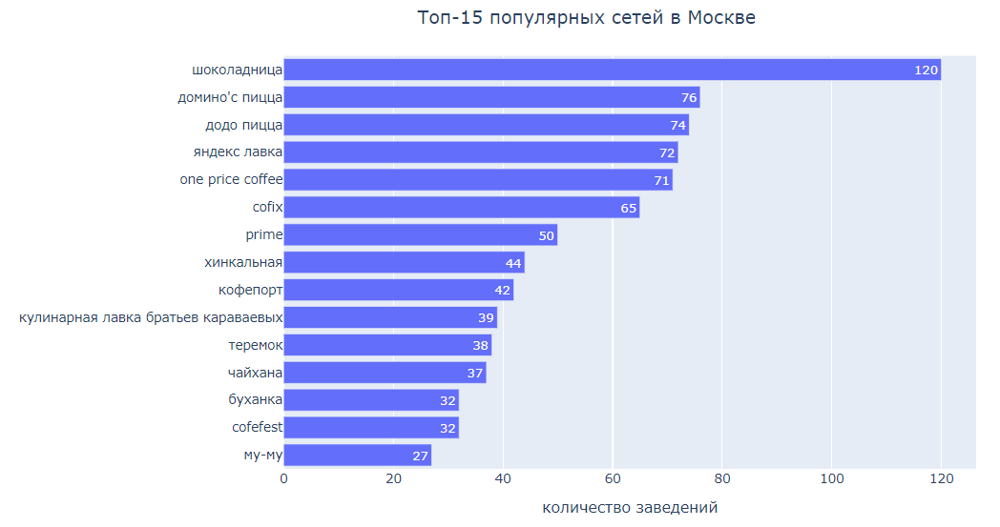

В список попали вполне ожидаемые и всем знакомые названия сетей общественного питания г. Москвы. По количеству точек с большим отрывом лидирует сеть кофеен "Шоколадница", в ней насчитывается 120 заведений.

**Теперь отобразим общее количество сетевых заведений и количество сетевых заведений каждой категории по районам**. Для этого создадим сводную таблицу по районам и кол-вом заведений в каждой категории и визуализируем их в одном графике:

district              СЗАО  ЮВАО  ЮЗАО   ВАО  СВАО   САО   ЗАО   ЮАО   ЦАО
     category                                                             
name бар,паб           NaN   NaN   1.0   2.0   NaN   NaN   NaN   NaN   1.0
     булочная          3.0   NaN   1.0   1.0   6.0   8.0   5.0   NaN   1.0
     быстрое питание   2.0   2.0   1.0   2.0   2.0   NaN   1.0   NaN   2.0
     кафе              1.0  12.0   9.0   6.0   6.0   7.0   8.0   4.0  47.0
     кофейня          20.0  15.0  25.0  30.0  37.0  40.0  41.0  34.0  94.0
     пиццерия         13.0  16.0  16.0  20.0  19.0  20.0  15.0  23.0   9.0
     ресторан          8.0  11.0  17.0  18.0  15.0  13.0  19.0  28.0  60.0
     столовая          NaN   NaN   NaN   1.0   NaN   NaN   NaN   NaN   1.0

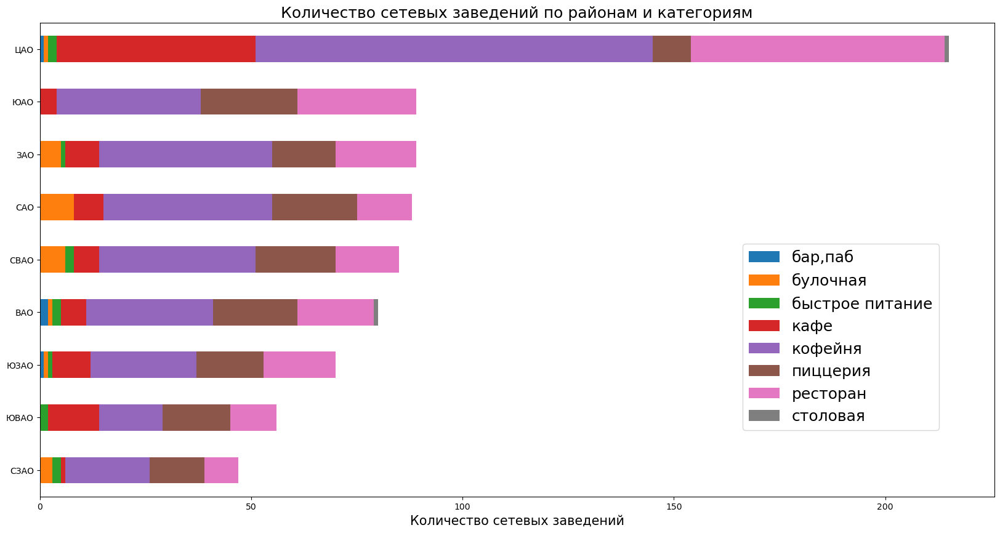

In [22]:
pivot_df_top_15_chain = pd.pivot_table(df_top_15_chain, index='district', columns='category', aggfunc={'name': 'count'}).T
sorted_pivot_df = pivot_df_top_15_chain[pivot_df_top_15_chain.sum().sort_values().index]  # сортируем по индексу
display(sorted_pivot_df)
# визуализируем данные:
sorted_pivot_df.T.plot.barh(stacked=True, figsize=(20, 10))
plt.title('Количество сетевых заведений по районам и категориям', size=18)
plt.xlabel('Количество сетевых заведений', size=15)
plt.ylabel(None)
plt.legend(sorted_pivot_df.index.get_level_values(1).to_list(), fontsize=18, bbox_to_anchor=(0.95, 0.55))
plt.show()

***В целом, картина распределения сетевых заведений по районам, существенно отличается в ЦАО:***
- центральный округ уверенно лидирует по общему кол-ву заведений, преобладающая категория здесь - **кофейни**, что вполне ожидаемо, поскольку там сосредоточена деловая активность жителей и кофе является ее неизенным атрибутом;
- далее по популярности следуют **рестораны** и **кафе**;
- заметна на графике также невысокая доля пиццерий, остальные категории не популярны.

***В спальных районах г. Москвы распределение сетевых заведений несколько иное:***
- категория **кофейня** здесь также лидирует, кроме ЮВАО, там на первом месте **пиццерия**;
- вторая по популярности категория отличается по районам - в ЮАО, ЗАО, ЮЗАО это **ресторан**, а в САО, СВАО, ВАО, ЮВАО и СЗАО это **пиццерия**, можно сказать, что рестораны и пиццерии имеют примерно равные доли и делят между собой вторую и третью позицию;
- следующая по популярности категория - **кафе**, но в СЗАО она уступает **булочным** и **предприятиям быстрого питания**;
- заметная доля **булочных** отмечается в районах ЗАО, САО, СВАО и СЗАО, остальные категории не популярны.

### 3.6 Соотношение категорий заведений по районам

Сгруппируем данные и построим визуализацию:

In [24]:
# считаем соотношения
ratio_df = df_2.groupby(['district', 'category']).size().groupby(level=0
                                                              ).apply(lambda x: round(100 * x / float(x.sum()), 2)
                                                                     ).reset_index().rename(columns={0: 'ratio'})
# настраиваем и выводим визуализацию
fig = px.bar(ratio_df, x='district', y='ratio', color='category', width=950, height=1000, text_auto='ratio')
fig.update_layout(title='Соотношение категорий заведений по районам г. Москвы',
                  xaxis_title=None, yaxis_title='Соотношение, %',
                  xaxis=dict(tickmode='array', tickvals=ratio_df['district'],
                             ticktext=ratio_df['district']), legend_title='Категории заведений')
fig.show()

**Скриншот графика Plotly для сайта GitHub** (для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))
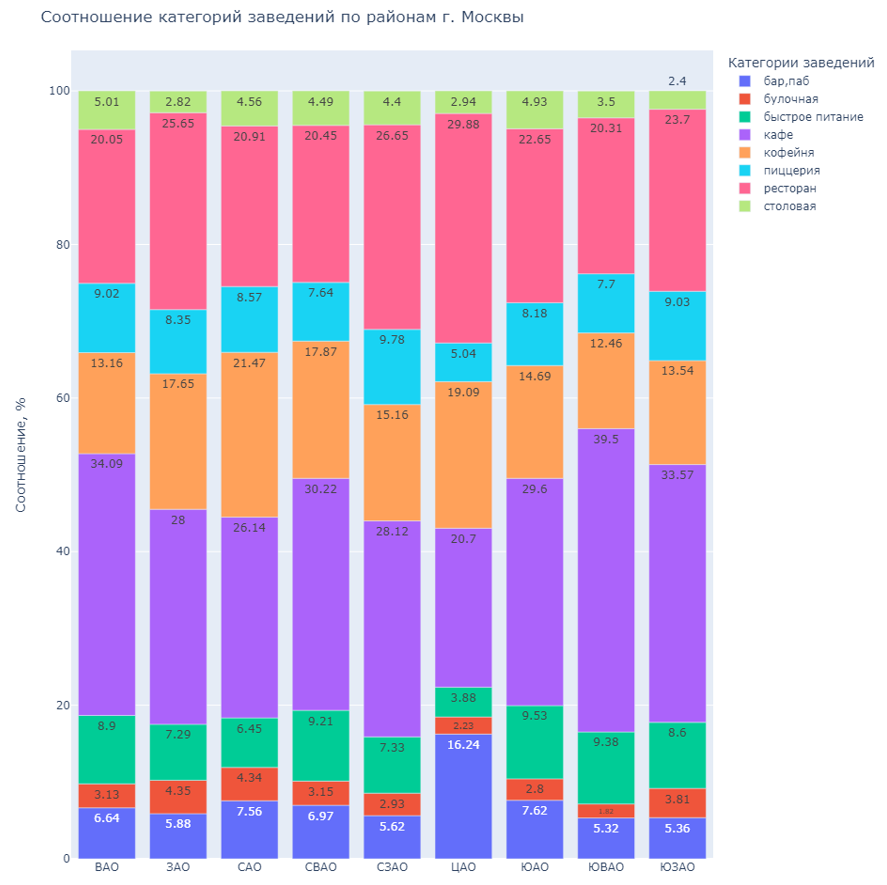

В датасете представлены 9 районов (округов). Центральный округ (ЦАО) в большей степени связан с деловой активностью и развитой сферой развлечений, и здесь преобладают офисные строения, концертные залы, клубы и т.п., а районы за пределами центра (ВАО, ЗАО, САО, СВАО, СЗАО, ЮАО, ЮВАО, ЮЗАО) больше предназначены для постоянного проживания, здесь значительно больше жилых домов, поэтому иногда их именуют спальными районами. Такое различие вполне естественно оказывает влияние на рынок общественного питания.  

**В центральной части города** более распространены **рестораны** (29,88% против 20-26% вне центра), достаточно распространены **кофейни**, их там (19,09%, 2-е место среди округов), а также **бары и пабы**, первые две категории больше всего подходят для деловых встреч, а бары и пабы в большей степени для развлечений и отдыха после работы.  
**Пиццерии** в центральной части распространены меньше, чем за ее пределами, вероятнее всего, основной спрос на пиццы формируется вечерами, когда люди заказывают еду на дом.  

**За пределами центральной части** более распространены заведения категории **кафе** (28-39% против 20,7% в центре), их вероятнее всего выбирают для ужина или бюджетных развлечений недалеко от дома, из-за разнообразия меню и доступных цен. **Рестораны** здесь распространены не так как в центре, но все же занимают ощутимую долю (20-26%). **Кофейни** больше распространены в САО (21,47%), среди остальных округов вне центральной части наблюдается разброс значений от 12,46 до 17,87%. Показатель по **барам и пабам** здесь варируется от 5 до 8%. Достаточно ровные доли по этим округам и в категории **пицца**(8 - 10%) и **быстрое питание** (7 - 9%).  

**Столовые** и **булочные** имеют самые низкие показатели по распространенности во всех районах г. Москвы.

### 3.7 Распределение средних рейтингов по категориям заведений

Сгруппируем данные и построим визуализацию:

In [25]:
rating_by_category = df_2.groupby('category').agg({'rating' : 'mean'}
                                               ).round(2).sort_values('rating', ascending = False).reset_index()
display(rating_by_category)

# настраиваем и выводим гистограмму:
fig = px.bar(rating_by_category.sort_values('rating'), x='rating', y='category', text='rating', width=500, height=400)
fig.update_layout(title='Средние рейтинги по категориям заведений', title_x=0.5, xaxis_title='значение рейтинга',
                  yaxis_title=None, showlegend=False)
fig.show()


,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


**Скриншот графика Plotly для сайта GitHub**  
(для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
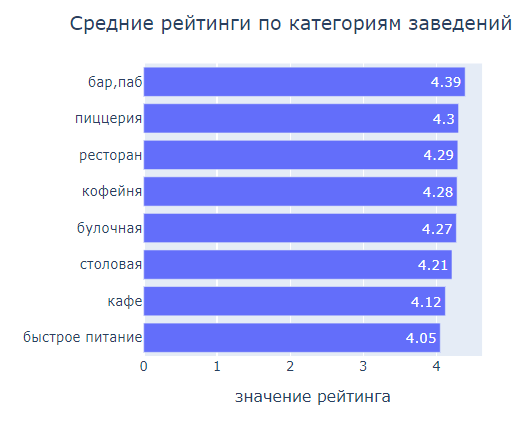

Средние значения рейтингов по категориям заведений отличаются в пределах 10%, что говорит о том, что вероятнее всего категория заведения не оказывает существенного влияния на рейтинг. Тем не менее, средний рейтинг баров и пабов находится на первом месте, и вполне возможно, что посетители данной категории заведений пребывают там в отличном настроении и охотнее оставляют высокие оценки.

Посмотрим теперь на распределение оценок по категориям заведений:

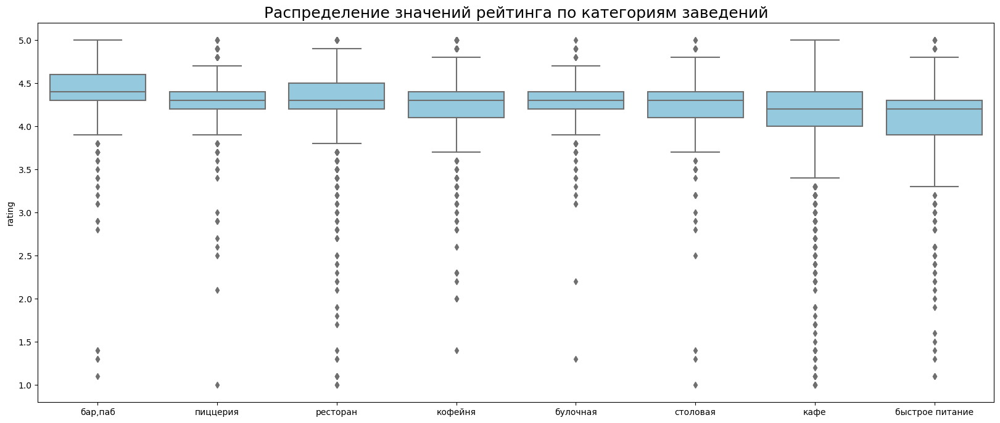

In [26]:
plt.figure(figsize=(20, 8))
sort_by = pd.DataFrame({col:vals['rating'] for col, vals in df_2.groupby(['category'])}  
                      ).mean().sort_values(ascending=False).index  # записываем переменную для сортировки медиан по убыванию
sns.boxplot(data=df_2, x='category', y='rating', order=sort_by, color='skyblue')  # строим boxplot с сортировкой по медианам
plt.title('Распределение значений рейтинга по категориям заведений', size=18)
plt.xlabel(None)
plt.show()

Действительно, бары и пабы чаще получают хорошие и отличные оценки от посетителей, а в пиццериях, ресторанах, кофейнях, булочных, столовых и предприятиях быстрого питания отличные оценки попадают в выбросы. 

### 3.8 Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

Для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории:

In [27]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df.sort_values(by='rating', ascending=False).style.format('{:.2f}',
                                                                         subset=['rating']).hide(axis='index')

district,rating
Центральный административный округ,4.38
Северный административный округ,4.24
Северо-Западный административный округ,4.21
Южный административный округ,4.18
Западный административный округ,4.18
Восточный административный округ,4.17
Юго-Западный административный округ,4.17
Северо-Восточный административный округ,4.15
Юго-Восточный административный округ,4.10


Теперь загрузим JSON-файл:

In [28]:
state_geo = '/datasets/admin_level_geomap.geojson'
with open(state_geo, encoding='utf-8') as f:
    geo_json = json.load(f)

Установим координаты центра г. Москвы, создадим карту и хороплет:

In [29]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data=geo_json, data=rating_df, columns=['district', 'rating'],
           key_on='feature.name', fill_color='PuBu', fill_opacity=0.8,
           legend_name='Средний рейтинг заведений по районам').add_to(m1)

# выводим карту
m1

**Скриншот карты Folium для сайта GitHub** (для просмотра карты в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
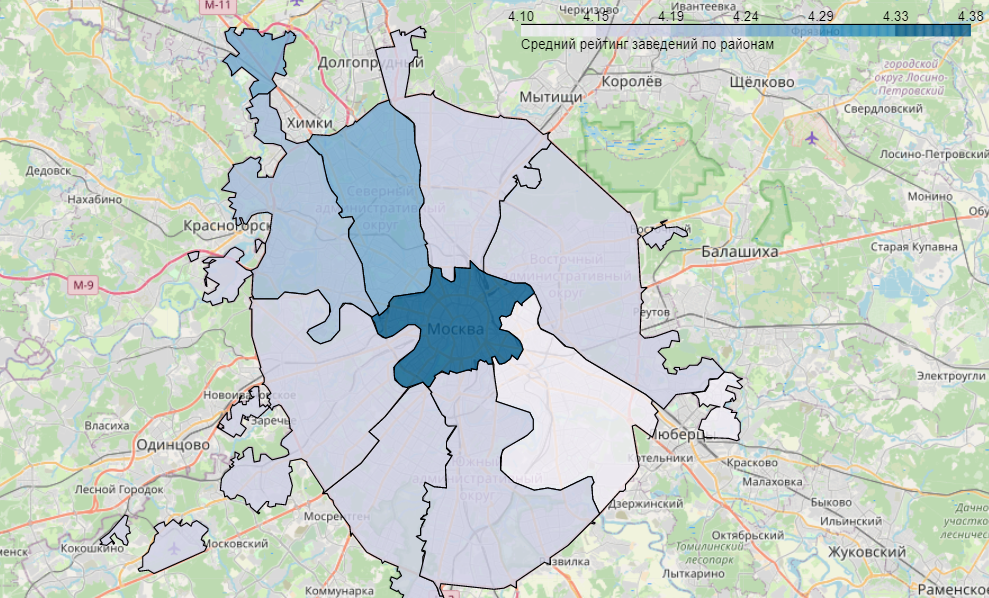

Теперь все наглядно - чем темнее заливка, тем выше рейтинг. ЦАО по среднему рейтингу в лидерах, в ЮВАО средний рейтинг самый низкий.

### 3.9 Отображение всех заведений датасета на карте с помощью кластеров

Отметим все заведения общественного питания г. Москвы на карте с помощью кластеров. Для этого создадим новую карту, затем кластер, и заполнним его маркерами с помощью функции:

In [30]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m2

**Скриншот карты Folium для сайта GitHub** (для просмотра карты в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
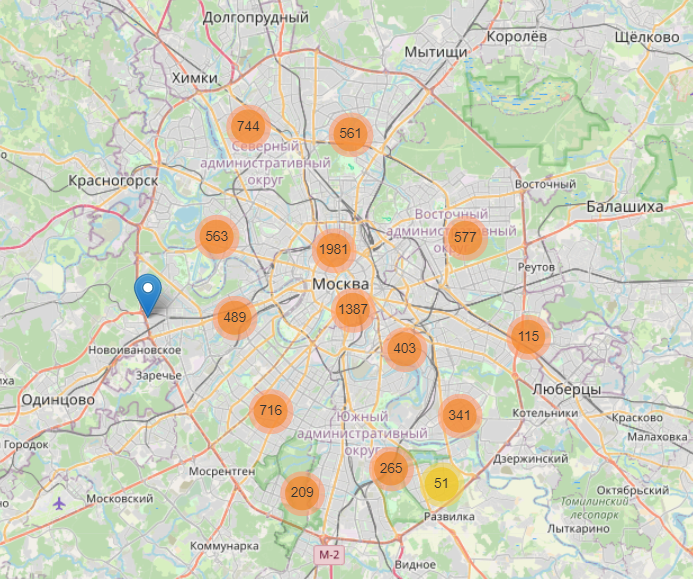

Наибольшее количество заведений сконцентрировано ближе к центру г. Москвы.

### 3.10 Топ-15 улиц по количеству заведений

Визуализируем данные с названиями топ-15 улиц по кол-ву заведений в г. Москве. Для этого сгруппируем данные, выведем гистограмму и посчитаем, сколько всего заведений попало в список Топ-15 улиц и какой процент они составляют от общего количества:

In [31]:
top_street_names = df['street'].value_counts().sort_values(ascending=False
                                                          ).index.to_list()[:15]  # создаем список топ-15
df_top_15_street = df[df['street'].isin(top_street_names)]  # создаем датафрейм с данными по топ-15 улиц

## группируем данные по названиям сетей и считаем кол-во торговых точек в каждой:
top_15_street = df_top_15_street.groupby('street').agg({'name': 'count'}
                                                  ).sort_values(by='name').reset_index() 
# настраиваем и выводим гистограмму:
fig = px.bar(top_15_street, x='name', y='street', text='name')
fig.update_layout(title='Топ-15 улиц по кол-ву заведений', title_x=0.55, xaxis_title='количество заведений',
                  yaxis_title=None, showlegend=False)
fig.show()

print(f'В список Топ-15 улиц вошло {top_15_street["name"].sum()} заведений, '
      f'что составляет {round(top_15_street["name"].sum() / df["name"].count() * 100, 1)} '
      f'% от общего количества.')          

В список Топ-15 улиц вошло 1257 заведений, что составляет 15.0 % от общего количества.


**Скриншот графика Plotly для сайта GitHub** (для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
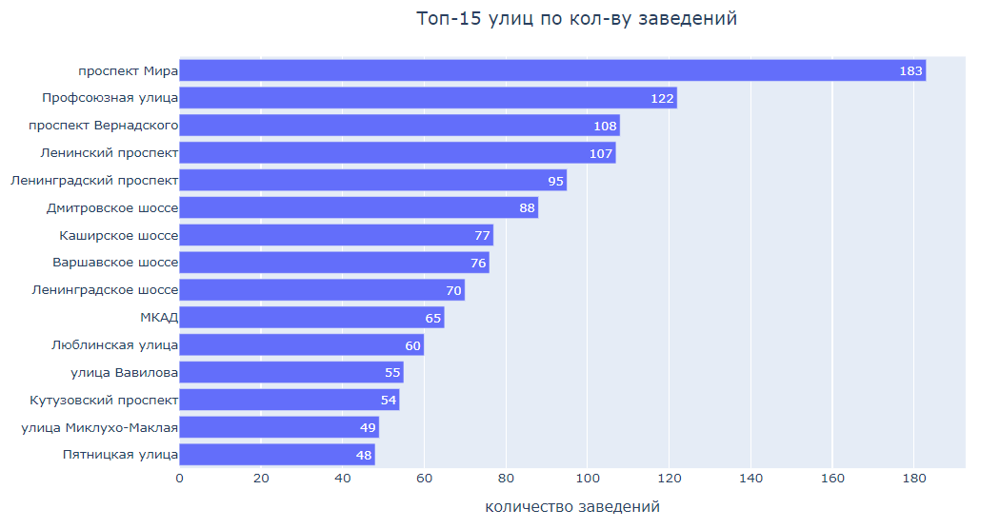

Проспект Мира лидирует по количеству заведений общественного питания с большим отрывом.

**Теперь построим график распределения количества заведений и их категорий по этим улицам**. Для этого создадим сводную таблицу по улицам и кол-вом заведений в каждой категории и визуализируем их в одном графике:

street                Варшавское шоссе  Дмитровское шоссе  Каширское шоссе  \
     category                                                                
name бар,паб                       6.0                6.0              2.0   
     булочная                      NaN                2.0              NaN   
     быстрое питание               7.0               10.0             10.0   
     кафе                         18.0               23.0             20.0   
     кофейня                      14.0               11.0             16.0   
     пиццерия                      4.0                8.0              5.0   
     ресторан                     20.0               24.0             19.0   
     столовая                      7.0                4.0              5.0   

street                Кутузовский проспект  Ленинградский проспект  \
     category                                                        
name бар,паб                           2.0                    15.0   
     булочная                          1.0                     4.0   
     быстрое питание                   2.0                     2.0   
     кафе                             14.0                    12.0   
     кофейня                          13.0                    25.0   
     пиццерия                          3.0                     9.0   
     ресторан                         16.0                    25.0   
     столовая                          3.0                     3.0   

street                Ленинградское шоссе  Ленинский проспект  \
     category                                                   
name бар,паб                          5.0                10.0   
     булочная                         2.0                 3.0   
     быстрое питание                  5.0                 2.0   
     кафе                            13.0                26.0   
     кофейня                         13.0                23.0   
     пиццерия                         3.0                 5.0   
     ресторан                        26.0                33.0   
     столовая                         3.0                 5.0   

street                Люблинская улица  МКАД  Профсоюзная улица  \
     category                                                     
name бар,паб                       5.0   1.0                6.0   
     булочная                      NaN   NaN                4.0   
     быстрое питание               5.0   9.0               15.0   
     кафе                         26.0  45.0               35.0   
     кофейня                      11.0   4.0               18.0   
     пиццерия                      1.0   NaN               15.0   
     ресторан                     10.0   5.0               26.0   
     столовая                      2.0   1.0                3.0   

street                Пятницкая улица  проспект Вернадского  проспект Мира  \
     category                                                                
name бар,паб                      9.0                   7.0           11.0   
     булочная                     3.0                   1.0            4.0   
     быстрое питание              2.0                  12.0           21.0   
     кафе                         7.0                  25.0           53.0   
     кофейня                      6.0                  16.0           36.0   
     пиццерия                     3.0                  12.0           11.0   
     ресторан                    18.0                  33.0           45.0   
     столовая                     NaN                   2.0            2.0   

street                улица Вавилова  улица Миклухо-Маклая  
     category                                               
name бар,паб                     2.0                   3.0  
     булочная                    2.0                   NaN  
     быстрое питание            11.0                   4.0  
     кафе                       15.0                  21.0  
     кофейня                    10.0             

street                Пятницкая улица  улица Миклухо-Маклая  \
     category                                                 
name бар,паб                      9.0                   3.0   
     булочная                     3.0                   NaN   
     быстрое питание              2.0                   4.0   
     кафе                         7.0                  21.0   
     кофейня                      6.0                   4.0   
     пиццерия                     3.0                   2.0   
     ресторан                    18.0                  15.0   
     столовая                     NaN                   NaN   

street                Кутузовский проспект  улица Вавилова  Люблинская улица  \
     category                                                                  
name бар,паб                           2.0             2.0               5.0   
     булочная                          1.0             2.0               NaN   
     быстрое питание                   2.0            11.0               5.0   
     кафе                             14.0            15.0              26.0   
     кофейня                          13.0            10.0              11.0   
     пиццерия                          3.0             3.0               1.0   
     ресторан                         16.0            12.0              10.0   
     столовая                          3.0             NaN               2.0   

street                МКАД  Ленинградское шоссе  Варшавское шоссе  \
     category                                                       
name бар,паб           1.0                  5.0               6.0   
     булочная          NaN                  2.0               NaN   
     быстрое питание   9.0                  5.0               7.0   
     кафе             45.0                 13.0              18.0   
     кофейня           4.0                 13.0              14.0   
     пиццерия          NaN                  3.0               4.0   
     ресторан          5.0                 26.0              20.0   
     столовая          1.0                  3.0               7.0   

street                Каширское шоссе  Дмитровское шоссе  \
     category                                              
name бар,паб                      2.0                6.0   
     булочная                     NaN                2.0   
     быстрое питание             10.0               10.0   
     кафе                        20.0               23.0   
     кофейня                     16.0               11.0   
     пиццерия                     5.0                8.0   
     ресторан                    19.0               24.0   
     столовая                     5.0                4.0   

street                Ленинградский проспект  Ленинский проспект  \
     category                                                      
name бар,паб                            15.0                10.0   
     булочная                            4.0                 3.0   
     быстрое питание                     2.0                 2.0   
     кафе                               12.0                26.0   
     кофейня                            25.0                23.0   
     пиццерия                            9.0                 5.0   
     ресторан                           25.0                33.0   
     столовая                            3.0                 5.0   

street                проспект Вернадского  Профсоюзная улица  проспект Мира  
     category                                                                 
name бар,паб                           7.0                6.0           11.0  
     булочная                          1.0                4.0            4.0  
     быстрое питание                  12.0               15.0           21.0  
     кафе                             25.0               35.0           53.0  
     кофейня                          16.0               18.0           36.0  
     пиццерия                         12.0

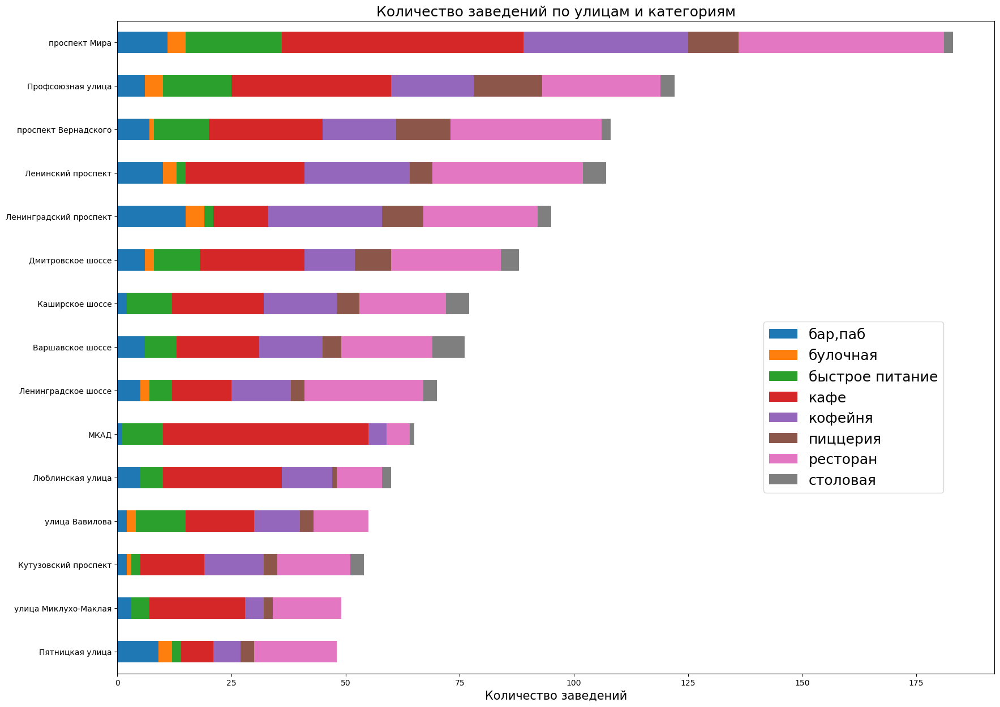

In [32]:
pivot_df_top_15_street = pd.pivot_table(df_top_15_street, index='street', columns='category', aggfunc={'name': 'count'}).T
display(pivot_df_top_15_street)
sorted_pivot_df_2 = pivot_df_top_15_street[pivot_df_top_15_street.sum().sort_values().index]  # сортируем по индексу
display(sorted_pivot_df_2)
# визуализируем данные:
sorted_pivot_df_2.T.plot.barh(stacked=True, figsize=(20, 15))
plt.title('Количество заведений по улицам и категориям', size=18)
plt.xlabel('Количество заведений', size=15)
plt.ylabel(None)
plt.legend(sorted_pivot_df.index.get_level_values(1).to_list(), fontsize=18, bbox_to_anchor=(0.95, 0.55))
plt.show()

Среди Топ-15 улиц лидируют категории **кафе** и **рестораны**, следом идут кофейни. По распределению категорий среди них выделяется МКАД - здесь преобладает доля **кафе** и минимальное кол-во **ресторанов**, **кофеен**, **баров и пабов**, что не удивительно, учитывая фактор транспортной доступности. 

### 3.11 Улицы с одним объектом общепита

Посчитаем кол-во улиц с одним объектом общественного питания и выведе их на экран:

In [33]:
one_place_streets = list(df[df['street']
                            .isin(df['street'].value_counts()[df_2['street'].value_counts() == 1].index)]['street'].unique())
print('\033[1m' f'В Москве {len(one_place_streets)} улиц с одним объектом общественного питания:''\033[0m')
print(one_place_streets)

В Москве 458 улиц с одним объектом общественного питания:
['улица Бусиновская Горка', 'Прибрежный проезд', 'парк Левобережный', 'Угличская улица', 'ландшафтный заказник Лианозовский', 'Лианозовский парк культуры и отдыха', 'Новгородская улица', 'парк Алтуфьево', 'Бибиревская улица', 'Лианозовский проезд', 'Челобитьевское шоссе', 'Костромская улица', 'Проектируемый проезд № 5265', 'улица 800-летия Москвы', 'парк Ангарские Пруды', 'Вагоноремонтная улица', 'Мурановская улица', 'улица Конёнкова', 'улица Грекова', 'Чермянский проезд', 'парк Этнографическая деревня Бибирево', 'Челюскинская улица', 'Таёжная улица', 'Парусный проезд', 'Светлогорский проезд', 'Валдайский проезд', 'Пулковская улица', '3-й Лихачёвский переулок', 'Талдомская улица', '3-й Михалковский переулок', 'парк Дружбы', 'проезд Донелайтиса', 'Новопоселковая улица', 'Новая улица', 'Клинская улица', 'Коптевский бульвар д 18 А стр 1', 'улица Кашёнкин Луг', 'Северный бульвар', 'Отрадный проезд', 'Верхнелихоборская улица', 'улица

Список получился достаточно большой, посмотрим как эти заведения распределяются по категориям и по районам:

In [34]:
one_place_streets_df = df[df['street'].isin(one_place_streets)]
print()
print('\033[1m''Распределение одиночных заведений по категориям:''\033[0m')
print(one_place_streets_df['category'].value_counts())
print()
print('\033[1m''Распределение одиночных заведений по районам:''\033[0m')
one_place_streets_df['district'].value_counts()


Распределение одиночных заведений по категориям:
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Распределение одиночных заведений по районам:


Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Больше всего таких одиночных заведений среди кафе и в центральном округе. Вероятнее всего это связано с тем, что в центральной части города улицы короче. Отсутствие конкурентов может также говорить о трудной транспортной доступности, отсутствия достаточного клиентского трафика или же дефицита подходящих площадей под аренду. В последнем случае, стоит проводить периодический мониторинг объектов недвижимости, ведь отсутствие соседей-конкурентов, при достаточном трафике, будет способствовать развитию бизнеса. 

### 3.12 Значения средних чеков заведений

Чтобы исключить влияние выбросов, посчитаем медианые значения столбца **middle_avg_bill** для каждого района:

In [35]:
avg_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
avg_bill.sort_values(by='middle_avg_bill', ascending=False).style.format('{:.0f}',
                                                                         subset=['middle_avg_bill']).hide(axis='index')

district,middle_avg_bill
Западный административный округ,1000
Центральный административный округ,1000
Северо-Западный административный округ,700
Северный административный округ,650
Юго-Западный административный округ,600
Восточный административный округ,575
Северо-Восточный административный округ,500
Южный административный округ,500
Юго-Восточный административный округ,450


Установим координаты центра г. Москвы, создадим карту и хороплет:

In [36]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data=geo_json, data=avg_bill, columns=['district', 'middle_avg_bill'],
           key_on='feature.name', fill_color='PuBu', fill_opacity=0.8,
           legend_name='Средний чек заведений по районам').add_to(m3)
# выводим карту
m3

**Скриншот карты Folium для сайта GitHub** (для просмотра карты в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
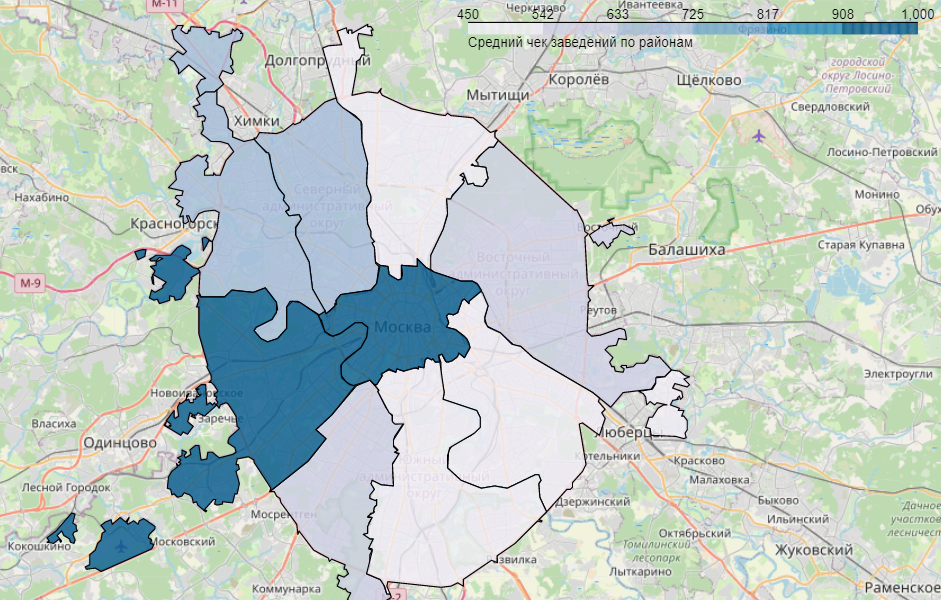

Наибольшая величина среднего чека наблюдается в Западном и Центральном округах, т.е. в самых престижных районах Москвы, где недвижимость также стоит дороже. Наименьшая величина среднего чека фиксируется в ЮВАО, а также в ЮАО и СВАО. Удаленность от центра оказывает влияние на снижение величины среднего чека, за исключением престижного ЗАО.

### 3.13 Выводы

**На этапе анализа данных сформированы следующие выводы:**  

1. По количеству объектов, самое популярное заведение - кафе, их в Москве 2377 (28,3% от общего кол-ва). На втором месте находятся рестораны, их 2042 (24,3% от общего кол-ва). Наименьшее кол-во заведений представлено в категории булочная, их всего 256, что составляет 3% от общего кол-ва.


2. Большинство заведений имеет до 300 посадочных мест, по максимальным значениям лидируют рестораны, бары/пабы, кофейни и рестораны быстрого питания. Меньше всего посадочных мест в кафе и столовых.  


3. В г. Москве преобладают несетевые заведения. В датасете представлено 5200 несетевых заведений (61,9% от общего кол-ва) и 3203 сетевых заведения (38,1% от общего кол-ва).   


4. Выявлено три категории, в которых сетевых заведений больше - это кофейни, пиццерии и булочные.  


5. В список Топ-15 популярных сетей г. Москвы вошли всем известные заведения. Их насчитывается 819, что составляет 9.7 % от общего количества. По количеству точек с большим отрывом лидирует сеть кофеен "Шоколадница", в ней насчитывается 120 заведений.    
При изучении распределения сетей по районам, выявлены существенные отличия по количеству заведений в центре Москвы и за его пределами:
- Центральный административный округ уверенно лидирует по общему кол-ву заведений, здесь больше всего кофеен, за ними по популярности следуют рестораны и кафе. Отмечается также невысокая доля пиццерий, остальные категории не популярны.
- За пределами центральной части категория кофейни также лидирует (кроме ЮВАО, там на первом месте пиццерия). Вторая по популярности категория отличается по районам - в ЮАО, ЗАО, ЮЗАО это ресторан, а в САО, СВАО, ВАО, ЮВАО и СЗАО это пиццерия, можно сказать, что рестораны и пиццерии имеют примерно равные доли и делят между собой вторую и третью позицию. Следующая по популярности категория - кафе, но в СЗАО она уступает булочным и предприятиям быстрого питания. Заметная доля булочных отмечается в районах ЗАО, САО, СВАО и СЗАО, остальные категории не популярны.


6. При изучении соотношений категорий заведений по районам (9 округов), установлено, что столовые и булочные имеют самые низкие показатели по распространенности во всех районах Москвы, вместе с тем, выявлены отличия между центральным и периферийными районами:
- В центральной части города более распространены рестораны (29,88% против 20-26% вне центра), достаточно распространены кофейни, их там (19,09%, 2-е место среди округов), а также бары и пабы. Пиццерии в центральной части распространены меньше, чем за ее пределами.
- За пределами центральной части более распространены заведения категории кафе (28-39% против 20,7% в центре). Рестораны здесь распространены не так как в центре, но все же занимают ощутимую долю (20-26%). Кофейни больше распространены в САО (21,47%), среди остальных округов вне центральной части наблюдается разброс значений от 12,46 до 17,87%. Показатель по барам и пабам здесь варируется от 5 до 8%. Достаточно ровные доли по этим округам и в категории пицца(8 - 10%) и быстрое питание (7 - 9%).


7. По среднему значению рейтинга лидируют бары и пабы, но разброс значений по категориям заведений находится в пределах 10%, что позволяет предположить, что категория заведения не оказывает существенного влияния на средний рейтинг. Тем не менее, разброс оценок по категориям отличается - в пиццериях, ресторанах, кофейнях, булочных, столовых и предприятиях быстрого питания отличные оценки попадают в выбросы.


8. Фоновая картограмма показывает, что ЦАО по среднему рейтингу(4.38) в лидерах, в ЮВАО средний рейтинг заведений (4.10) самый низкий.
 
 
9. Наибольшее количество заведений сконцентрировано ближе к центру г. Москвы.


10. На улицах из списка Топ-15 расположено 1257 заведений, что составляет 15.0 % от общего количества. Среди улиц лидирует Проспект Мира, там располагается наибольшее кол-во заведений общественного питания. Среди популярных категорий - кафе и рестораны, следом идут кофейни. По распределению категорий среди них выделяется МКАД - здесь преобладает доля кафе и минимальное кол-во ресторанов, кофеен, баров и пабов.


11. В Москве 458 улиц с одним объектом общественного питания. Больше всего таких одиночных заведений среди кафе и в центральном округе. В этих локациях рекомендуется провести дополнительное исследование - оценить потенциальный трафик и провести мониторинг объектов недвижимости.


12. Наибольшая величина среднего чека наблюдается в Западном и Центральном округах, т.е. в самых престижных районах Москвы.  Наименьшая величина среднего чека фиксируется в ЮВАО, а также в ЮАО и СВАО. Удаленность от центра оказывает влияние на снижение величины среднего чека (в 1,5 - 2 раза), за исключением престижного Западного административного округа.

## 4 Детализация исследования: открытие кофейни

Со стороны заказчиков из инвестиционного фонда сформулирован запрос - на основе полученных данных оценить возможность открытия крутой и доступной кофейни в Москве и выбрать наилучшую локацию для этого бизнеса. Примером для подражания озвучена кофейня «Central Perk» из сериала "Друзья".  

### 4.1 Формирование рекомендации



**Для формирования рекомендации необходимо ответить на следующие вопросы:** 

•	Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?  
•	Есть ли круглосуточные кофейни?  
•	Какие у кофеен рейтинги? Как они распределяются по районам?  
•	На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?  

**Сколько всего кофеен в датасете?**

In [37]:
print('В датасете всего', df.loc[df["category"] == "кофейня", "name"].count(),
      'кофеен, в том числе', category_by_chain.loc[((category_by_chain['category'] == 'кофейня'
                                                  ) & (category_by_chain['chain'] == 1))]['name'].values[0],
'сетевых и', category_by_chain.loc[((category_by_chain['category'] == 'кофейня'
                                                  ) & (category_by_chain['chain'] == 0))]['name'].values[0],
      'несетевых заведения.')

В датасете всего 1413 кофеен, в том числе 720 сетевых и 693 несетевых заведения.


**В каких районах их больше всего, каковы особенности их расположения?**

In [38]:
coffee_shops = df_2.query('category == "кофейня"') # фильтруем данные по категории кофейня

# группируем данные по округам
coffee_shops_location = coffee_shops.groupby('district'
                                            ).agg({'name': 'count'}
                                                 ).reset_index().sort_values(by='name')

# настраиваем и выводим гистограмму:
fig = px.bar(coffee_shops_location, x='name', y='district', text='name')
fig.update_layout(title='Распределение кофеен по районам', title_x=0.5, title_y=0.93,
                  xaxis_title='количество заведений', yaxis_title=None, showlegend=False)
fig.show()

**Скриншот графика Plotly для сайта GitHub** (для просмотра графика в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
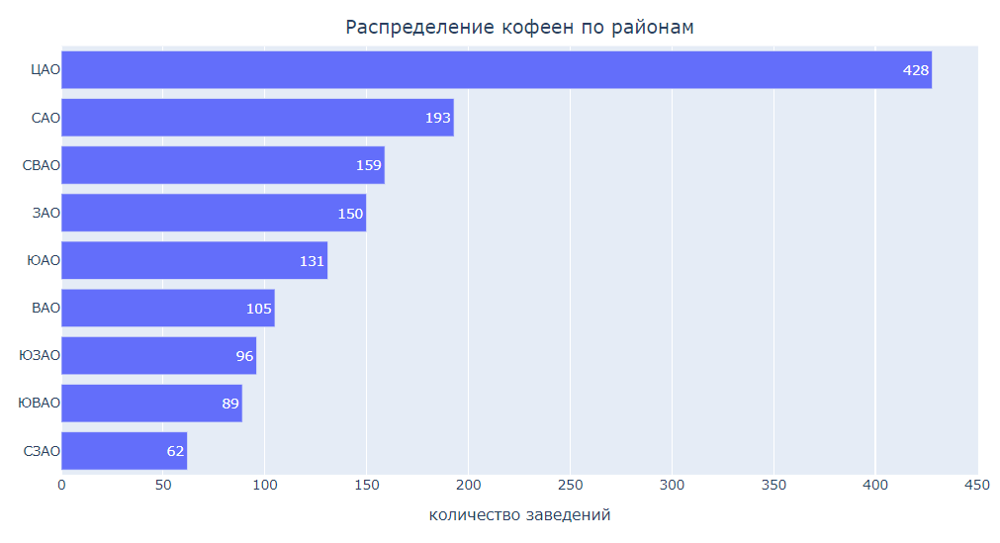

Наибольшее кол-во кофеен сосредоточено в ЦАО (428 заведений)

**Есть ли круглосуточные кофейни?**

In [39]:
print('В датасете всего', coffee_shops.loc[coffee_shops['is_24/7'] == True, 'name'].count(),
      'круглосуточных кофеен (', (((coffee_shops.loc[coffee_shops['is_24/7'] == True, 'name'].count())
      / df.loc[df["category"] == "кофейня", "name"].count()) * 100).round(1), '% от общего кол-ва),'
      ' в том числе', coffee_shops.loc[((coffee_shops['is_24/7'] == True
                                                              ) & (coffee_shops['chain'] == 1))]['name'].count(),
'сетевых и', coffee_shops.loc[((coffee_shops['is_24/7'] == True
                                                  ) & (coffee_shops['chain'] == 0))]['name'].count(),
      'несетевых заведений.')

В датасете всего 59 круглосуточных кофеен ( 4.2 % от общего кол-ва), в том числе 50 сетевых и 9 несетевых заведений.


Проверим их количество по округам:

In [40]:
around_the_clock = coffee_shops.loc[coffee_shops['is_24/7'] == True]
around_the_clock = around_the_clock.groupby('district', as_index=False)['name'].agg('count')
around_the_clock.sort_values(by='name', ascending=False)

,district,name
5,ЦАО,26
1,ЗАО,9
8,ЮЗАО,7
0,ВАО,5
2,САО,5
3,СВАО,3
4,СЗАО,2
6,ЮАО,1
7,ЮВАО,1


ЦАО с большим отрывом лидирует среди круглосуточных кофеен. Западный округ находится на втором месте (9 кофеен). В ЮАО и ЮВАО их всего по одной.

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [41]:
coffee_shops_df = df.query('category == "кофейня"') # фильтруем данные по категории с полным названием округа

rating_coffee_shops = coffee_shops_df.groupby('district', as_index=False)['rating'].agg('mean')
rating_coffee_shops.sort_values(by='rating', ascending=False).style.format('{:.2f}',
                                                                         subset=['rating']).hide(axis='index')

district,rating
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Юго-Западный административный округ,4.28
Восточный административный округ,4.28
Южный административный округ,4.23
Юго-Восточный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(geo_data=geo_json, data=rating_df, columns=['district', 'rating'],
           key_on='feature.name', fill_color='PuBu', fill_opacity=0.8,
           legend_name='Средний рейтинг заведений по районам', y=1.2).add_to(m4)

# выводим карту
m4

**Скриншот карты Folium для сайта GitHub** (для просмотра карты в интерактивном виде можно использовать [nbviewer](https://nbviewer.org/github/aefr1/data-analysis-projects/blob/main/public_catering_research/public_catering_research.ipynb))  
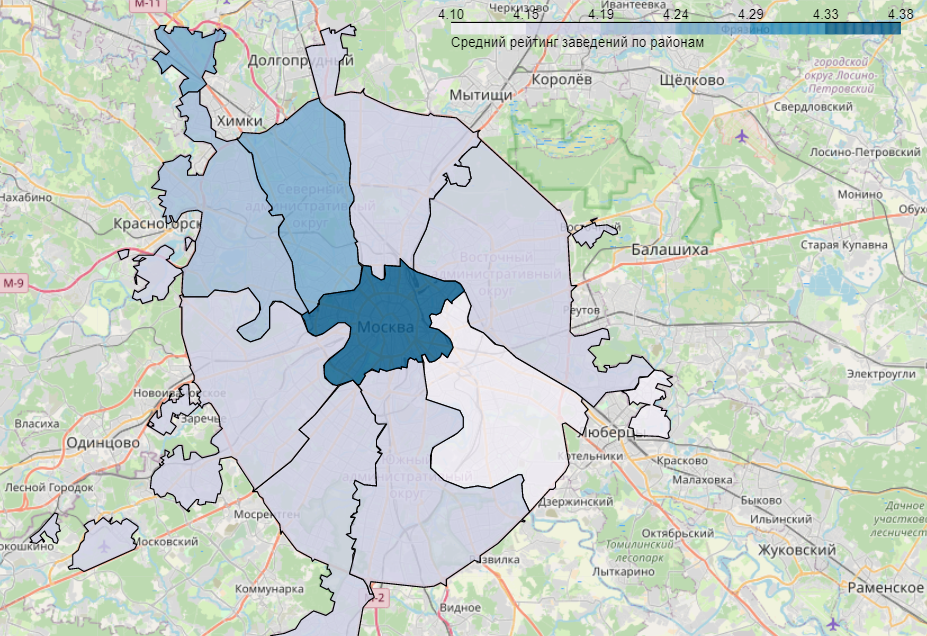

Кофейни, расположенные в ЦАО имеют более высокий ретинг(4.34), в тройку лучших округов по клиентским отзывам также попали СЗАО (4.33) и САО (4.29).

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

Поскольку в наших данных присутствуют выбросы, для сравнения стоимости чашки капучино, правильнее будет использовать медианные значения. Сгруппируем данные в таблицу с сортировкой медианных значений по убыванию:

In [43]:
coffee_price = coffee_shops.groupby('district').agg({'middle_coffee_cup': 'median'}).reset_index()
coffee_price.columns = ['район', 'цена чашки капучино']
coffee_price.sort_values(by='цена чашки капучино', ascending=False
                             ).style.format({'цена чашки капучино': '{:.0f}'}).hide(axis='index')

район,цена чашки капучино
ЮЗАО,198
ЦАО,190
ЗАО,189
СЗАО,165
СВАО,162
САО,159
ЮАО,150
ЮВАО,148
ВАО,135


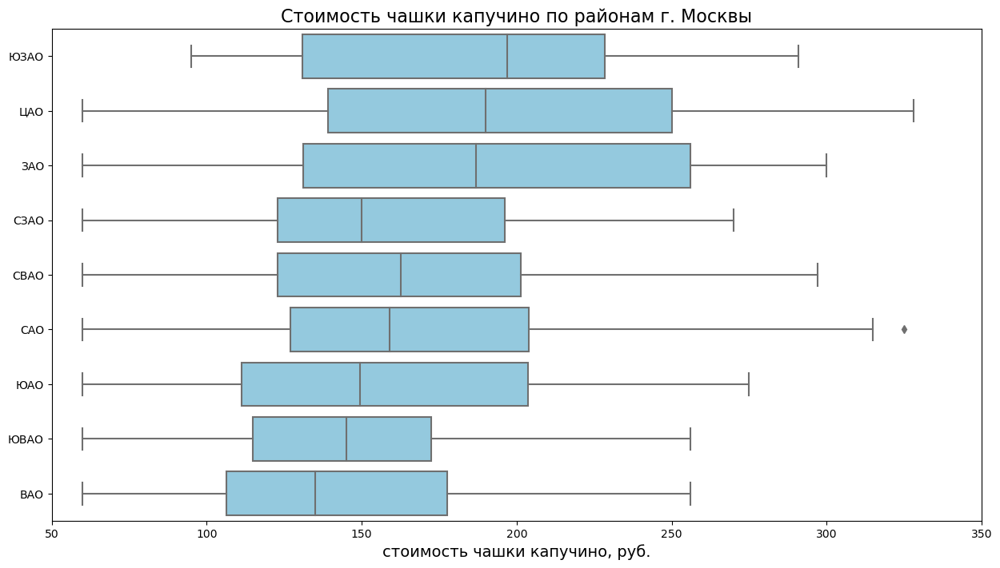

In [44]:
plt.figure(figsize=(15, 8))
sort_by = pd.DataFrame({col:vals['middle_coffee_cup'] for col, vals in coffee_shops.groupby(['district'])}  
                      ).median().sort_values(ascending=False).index  # записываем переменную для сортировки медиан по убыванию
sns.boxplot(data=df_2, x='middle_coffee_cup', y='district', order=sort_by, color='skyblue')  # строим boxplot с сортировкой по медианам
plt.title('Стоимость чашки капучино по районам г. Москвы', size=16)
plt.xlabel('стоимость чашки капучино, руб.', size=14)
plt.xlim([50,350])
plt.ylabel(None)
plt.show()

Самые высокая медианная стоимость чашки капучино зафиксирована в трех округах: ЮЗАО(198 руб.), ЦАО(190 руб.), ЗАО(189 руб.), а самая низкая медианная стоимость в ЮВАО(148 руб.) и ВАО(135 руб.), очевидно, что уровень спроса здесь ниже, и конкуренция, соответственно выше. По максимальному значению стоимости чашки кофе, согласно построенному боксплоту, лидирует ЗАО.

### 4.2 Выводы и рекомендации для открытия нового заведения

**На основе проведенной детализации исследования, сформулированы следующие выводы:**

1. По количеству объектов общественного питания, кофейни занимают устойчивую третью позицию (после кафе и ресторанов). В Москве насчитывается 1413 таких заведений, что составляет 16,8 % от общего количества. Примерно половина из них является сетевыми заведениями. Данная категория относится к сегменту с высокой конкуренцией, в виду достаточно низкого порога вхождения в бизнес. Согласно оценок экспертов, нижний порог инвестиций составляет около 600 тыс. рублей. Одновременно с этим, широкая распространенность данных заведений, говорит нам о наличии устойчивого спроса среди покупателей. Следовательно, открытие стильной и доступной кофейни в Москве не лишено смысла.  


2.  В ЦАО расположено 428 кофеен, это около 30% от общего кол-ва. С учетом высокой сосредоточенности заведений общественного питания в центральной части, а также высокой стоимости аренды, выбор центральной части города для доступного кафе - не лучший выбор, особенно с учетом современной тенденции к миграции офисов за пределы центральной части. Вне центра, самые популярные округа по распространенности кофеен - САО (193 кофейни), СВАО (159 кофеен) и ЗАО (150 кофеен). При выборе локации будем ориентироваться на эти активно развивающиеся районы.


3. В датасете всего 59 круглосуточных кофеен (4,2% от общего кол-ва), в том числе 50 сетевых и 9 несетевых заведений. ЦАО с большим отрывом лидирует среди круглосуточных кофеен, Западный округ находится на втором месте (9 кофеен), а в ЮАО и ЮВАО их всего по одной. Приведенная статистика говорит нам о том, что данный формат работы не слишком распространен среди кофеен. Очевидно, что для запуска нового заведения, затраты на круглосуточную работу, при не слишком очевидном финансовом результате - будут лишними. К вопросу круглосуточной работы можно будет вернуться немного позже, когда сформируется первоначальный пул клиентов.


4. Кофейни, расположенные в ЦАО имеют более высокий ретинг(4.34), в тройку лучших округов по клиентским отзывам также попали СЗАО (4.33) и САО (4.29). СВАО и ЗАО имеют самые низкие оценки, и по показателям рейтинга являются наиболее привлекательными округами, поскольку запуск заведения с улучшенными сервисными харакктеристиками по отношению к конкурентам, может увеличить приток органических клиентов.


5. Самые высокая медианная стоимость чашки капучино зафиксирована в трех округах: ЮЗАО (198 руб.), ЦАО (190 руб.) и ЗАО (189 руб.), а самая низкая медианная стоимость в ЮВАО (148 руб.) и ВАО (135 руб.), очевидно, что уровень спроса здесь ниже, и конкуренция, соответственно выше. По максимальному значению стоимости чашки кофе, согласно построенному боксплоту, лидирует ЗАО. Высокая медианная и максимальная стоимость чашки кофе в Западном административном округе является позитивным фактором, поскольку говорит о наличии платежеспособности клиентов, и может косвенно свидетельствовать о наличии большего спроса и меньшей конкуренции, в сравнении с другими районами.

**Рекомендации для открытия нового заведения:**

1. На основе приведенных выше факторов, рекомендуем рассмотреть вариант открытия кофейни в Западном административном округе.   


2. Вопрос масштабирования бизнеса (построения сети кофеен), можно оставить за рамками данного исследования, поскольку очевидных преимуществ для сетей в данной категории не выявлено. Для инвестора это будет очевидным только после расчета детального бизнес-плана и плана инвестиций.


3. В качестве дополнительной рекомендации, предлагается провести дополнительное исследование трафика и объектов недвижимости на улицах с одиночными заведениями общественного питания в Западном административном округе.

## 5 Ссылка на презентацию

Презентация для заказчика: <https://disk.yandex.ru/i/UWb899lMMBVDEg> 